In [34]:
import numpy as np
import pandas as pd
import math
import pickle
import sqlite3
from sklearn import metrics
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, normalize
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sqlalchemy import create_engine
import sys, os
sys.path.insert(0,'../scripts/')
from data_fetch import get_data
from helper import Helper
from Randomforest_regressor import randomforestregressor

In [2]:
user_engagement_data = get_data('data/user_engagement_data.csv','C:/Users/User/Desktop/Telecom-data-analysis','user_engagement_v1')

In [3]:
user_experience_data = get_data('data/user_experience_data.csv','C:/Users/User/Desktop/Telecom-data-analysis','user_experience_v1')

In [4]:
with open("../models/user_experience_model.pkl", "rb") as f:
    model_user_experience = pickle.load(f)

In [5]:
with open("../models/user_engagement_model.pkl", "rb") as f:
    model_user_engagement = pickle.load(f)

In [6]:
df_engagement = user_engagement_data.set_index('MSISDN/Number')[['xDR Sessions', 'Dur. (ms)', 'Total Data Volume (Bytes)']]

In [7]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_engagement)
scaled_data

array([[-0.54866182, -0.15663495,  0.54827382],
       [-0.54866182,  0.5847055 , -1.28048981],
       [-0.54866182,  0.05308016, -0.16800961],
       ...,
       [-0.54866182, -1.39672249,  0.13265472],
       [-0.54866182,  0.12224972, -0.46103285],
       [-0.54866182,  1.40982166, -0.16719549]])

In [8]:
normalized_data = normalize(scaled_data)
normalized_data

array([[-0.69336056, -0.19794433,  0.69287024],
       [-0.36315599,  0.38701309, -0.84754858],
       [-0.95210963,  0.09211163, -0.29155221],
       ...,
       [-0.3642029 , -0.9271474 ,  0.08805649],
       [-0.7546951 ,  0.16815689, -0.63415974],
       [-0.36047983,  0.926276  , -0.10985018]])

In [9]:
less_engaged_cluster = 5
distance = model_user_engagement.fit_transform(normalized_data)
distance_from_less_engaged_cluster = list(map(lambda x: x[less_engaged_cluster], distance))
user_engagement_data['engagement_score'] = distance_from_less_engaged_cluster
user_engagement_data.to_csv('../data/user_engagement_score_data.csv')
user_engagement_data.head()

,MSISDN/Number,cluster,xDR Sessions,Dur. (ms),Total Data Volume (Bytes),engagement_score
0,33601001722,2,1.0,116720.0,8.786906e+08,1.396374
1,33601001754,4,1.0,181230.0,1.568596e+08,0.951726
2,33601002511,4,1.0,134969.0,5.959665e+08,0.873946
3,33601007832,5,1.0,49878.0,4.223207e+08,0.258671
4,33601008617,1,2.0,37104.0,1.457411e+09,1.686964


In [10]:
df_experience = user_experience_data.set_index('MSISDN/Number')[['Total Avg RTT (ms)', 'Total Avg Bearer TP (kbps)', 'Total TCP Retrans. Vol (Bytes)']]

In [11]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_experience)
scaled_data

array([[-0.66447913, -0.66553306, -0.07718727],
       [-0.86244675, -0.66454954,  1.36477629],
       [-0.4929072 , -0.66463506,  0.20659437],
       ...,
       [-0.58529209, -0.22555909, -0.68257811],
       [-0.74366618, -0.66382259, -0.67580862],
       [-0.77006186, -0.66737181, -0.70461297]])

In [12]:
normalized_data = normalize(scaled_data)
normalized_data

array([[-0.7041785 , -0.70529539, -0.08179883],
       [-0.49399312, -0.38064136,  0.78171795],
       [-0.5779429 , -0.77929702,  0.24223576],
       ...,
       [-0.63137291, -0.24331765, -0.73631839],
       [-0.61749234, -0.55119538, -0.56114781],
       [-0.62157173, -0.53868328, -0.56874327]])

In [13]:
worst_experience_cluster = 1
distance = model_user_experience.fit_transform(normalized_data)
distance_from_worst_experience_cluster = list(map(lambda x: x[worst_experience_cluster], distance))
user_experience_data['experience_score'] = distance_from_worst_experience_cluster
user_experience_data.to_csv('../data/user_experience_score_data.csv')
user_experience_data.head()

,MSISDN/Number,cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score
0,33601001722,0,46.0,76.0,2895381.0,1.594291
1,33601001754,2,31.0,99.0,9272453.0,1.485866
2,33601002511,0,59.0,97.0,4150403.0,1.600012
3,33601007832,0,84.0,248.0,2396.0,1.410465
4,33601008617,1,119.0,56844.0,9738882.0,0.811044


In [14]:
user_engagement_data.rename(columns={'cluster': 'engagement_cluster'}, inplace=True)
user_experience_data.rename(columns={'cluster': 'experience_cluster'}, inplace=True)

In [15]:
df_telco_user_satisfaction = pd.merge(user_engagement_data, user_experience_data, on='MSISDN/Number')
df_telco_user_satisfaction['satisfaction_score'] = (df_telco_user_satisfaction['engagement_score'] + df_telco_user_satisfaction['experience_score'])/2
df_telco_user_satisfaction.to_csv('../data/user_satisfaction_score_data.csv')
df_telco_user_satisfaction.head()

,MSISDN/Number,engagement_cluster,xDR Sessions,Dur. (ms),Total Data Volume (Bytes),engagement_score,experience_cluster,Total Avg RTT (ms),Total Avg Bearer TP (kbps),Total TCP Retrans. Vol (Bytes),experience_score,satisfaction_score
0,33601001722,2,1.0,116720.0,8.786906e+08,1.396374,0,46.0,76.0,2895381.0,1.594291,1.495333
1,33601001754,4,1.0,181230.0,1.568596e+08,0.951726,2,31.0,99.0,9272453.0,1.485866,1.218796
2,33601002511,4,1.0,134969.0,5.959665e+08,0.873946,0,59.0,97.0,4150403.0,1.600012,1.236979
3,33601007832,5,1.0,49878.0,4.223207e+08,0.258671,0,84.0,248.0,2396.0,1.410465,0.834568
4,33601008617,1,2.0,37104.0,1.457411e+09,1.686964,1,119.0,56844.0,9738882.0,0.811044,1.249004


In [16]:
df_telco_user_satisfaction = df_telco_user_satisfaction[['MSISDN/Number', 'engagement_score','experience_score', 'satisfaction_score']]
df_telco_user_satisfaction.set_index('MSISDN/Number', inplace=True)
df_telco_user_satisfaction.head()

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33601001722,1.396374,1.594291,1.495333
33601001754,0.951726,1.485866,1.218796
33601002511,0.873946,1.600012,1.236979
33601007832,0.258671,1.410465,0.834568
33601008617,1.686964,0.811044,1.249004


In [17]:
top10_satisfied = df_telco_user_satisfaction.sort_values('satisfaction_score', ascending=False).head(10)
top10_satisfied

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33660797730,1.951768,1.602381,1.777075
33650087944,1.949627,1.603130,1.776378
33661008497,1.950699,1.601453,1.776076
33659526858,1.949880,1.601434,1.775657
33631114411,1.945628,1.602555,1.774091
33614111289,1.949079,1.599058,1.774068
33650973018,1.951693,1.596355,1.774024
33669365983,1.948605,1.599430,1.774017
33658515669,1.945448,1.602371,1.773909


In [18]:
X = df_telco_user_satisfaction[['engagement_score', 'experience_score']]
y = df_telco_user_satisfaction[['satisfaction_score']]


In [19]:
model = randomforestregressor(X,y,n_estimators=15,max_depth=7,random_state=8)

2022/11/12 00:16:02 INFO mlflow.tracking.fluent: Experiment with name 'Predicting User Satisfaction using Random Forest Regressor' does not exist. Creating a new experiment.
c:\Python39\lib\site-packages\sklearn\pipeline.py:394: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  self._final_estimator.fit(Xt, y, **fit_params_last_step)


StandardScaler()


In [20]:
model[0]

array([1.17127325, 1.41770784, 1.30131508, ..., 1.426078  , 0.48010924,
       1.33927648])

In [21]:
model[1]

,feature,feature_importances
0,engagement_score,0.777302
1,experience_score,0.222698


In [22]:
model[2]

0.9965323606944074

In [23]:
model[3]

0.00036363393739303736

In [24]:
df_copy = df_telco_user_satisfaction.copy(deep=True)
df_copy.head()

,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,
33601001722,1.396374,1.594291,1.495333
33601001754,0.951726,1.485866,1.218796
33601002511,0.873946,1.600012,1.236979
33601007832,0.258671,1.410465,0.834568
33601008617,1.686964,0.811044,1.249004


In [25]:
df_copy = df_copy[['engagement_score', 'experience_score']]
df_copy.head()

,engagement_score,experience_score
MSISDN/Number,,
33601001722,1.396374,1.594291
33601001754,0.951726,1.485866
33601002511,0.873946,1.600012
33601007832,0.258671,1.410465
33601008617,1.686964,0.811044


In [26]:
helper = Helper(df_copy)
helper.getOverview(['engagement_score', 'experience_score'])

Name of columns,engagement_score,experience_score
Min,0.047558,0.396544
Q1,0.423446,0.908193
Median,0.986696,1.380738
Q3,1.640496,1.50035
Max,1.952645,1.603496
IQR,1.21705,0.592157
Lower fence,-1.40213,0.019958
Upper fence,3.466072,2.388586
Skew,0.100607,-0.661161
Number_of_outliers,0,0


<AxesSubplot:>

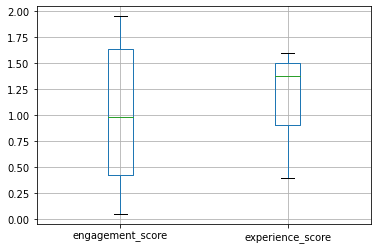

In [27]:
df_copy.boxplot()

In [28]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_copy)
scaled_data

array([[ 0.59073436,  1.12801509],
       [-0.12248473,  0.81540022],
       [-0.24724467,  1.14450822],
       ...,
       [-0.31505476,  0.57368256],
       [-0.42050247,  0.86916818],
       [ 0.85292294,  0.86008135]])

In [29]:
kmeans = KMeans(n_clusters=2, random_state=1).fit(normalized_data)
kmeans.labels_

array([0, 1, 0, ..., 0, 0, 0])

In [30]:
df_telco_user_satisfaction.insert(0, 'satisfaction_cluster', kmeans.labels_)
df_telco_user_satisfaction.to_csv('../data/user_satisfaction_scores_data.csv')
df_telco_user_satisfaction

,satisfaction_cluster,engagement_score,experience_score,satisfaction_score
MSISDN/Number,,,,
33601001722,0,1.396374,1.594291,1.495333
33601001754,1,0.951726,1.485866,1.218796
33601002511,0,0.873946,1.600012,1.236979
33601007832,0,0.258671,1.410465,0.834568
33601008617,1,1.686964,0.811044,1.249004
...,...,...,...,...
33789967113,0,0.832799,1.482762,1.157780
33789980299,1,1.949945,0.807739,1.378842
33789996170,0,0.831671,1.402030,1.116850


In [31]:
df_telco_user_satisfaction['satisfaction_cluster'].value_counts()

0    55486
1    50230
Name: satisfaction_cluster, dtype: int64

In [32]:
import plotly.io as pio
pio.renderers.default = "notebook"
fig = px.scatter(df_telco_user_satisfaction, x='engagement_score', y='experience_score',color='satisfaction_cluster', size='satisfaction_score')
fig.show()

In [33]:
df_telco_user_satisfaction.groupby('satisfaction_cluster').agg({'satisfaction_score': 'mean', 'experience_score': 'mean'})

,satisfaction_score,experience_score
satisfaction_cluster,,
0,1.195566,1.456716
1,1.027208,0.922856


In [35]:
sqliteConnection = sqlite3.connect('feature_store.db')

In [37]:
cursor = sqliteConnection.cursor()

In [36]:
features = df_telco_user_satisfaction.to_sql("telco_satisfaction_score", con=sqliteConnection, if_exists='replace')

In [38]:
cursor.execute("SELECT * FROM telco_satisfaction_score;").fetchall()

[(33601001722, 0, 1.3963737629299817, 1.5942913104643055, 1.4953325366971435),
 (33601001754, 1, 0.951726183411304, 1.4858658137207144, 1.218795998566009),
 (33601002511, 0, 0.8739461502653146, 1.6000116920246479, 1.2369789211449813),
 (33601007832, 0, 0.2586710937510962, 1.4104652948273046, 0.8345681942892005),
 (33601008617, 1, 1.6869643645743777, 0.8110438973500439, 1.2490041309622109),
 (33601010682, 0, 1.7943602139490153, 1.4199930519294797, 1.6071766329392476),
 (33601011634, 1, 1.6644584197735774, 0.9343404603275317, 1.2993994400505546),
 (33601011959, 0, 0.14001569905469763, 1.4752426078740883, 0.807629153464393),
 (33601014694, 1, 1.8982952491120983, 1.4010267629288984, 1.6496610060204984),
 (33601020306, 0, 1.1489541823280884, 1.5656727243157231, 1.3573134533219058),
 (33601021045, 0, 1.2251465949237035, 1.5135529930938871, 1.3693497940087953),
 (33601021217, 1, 0.6699634669685676, 1.0673414656239075, 0.8686524662962376),
 (33601022743, 0, 0.2452516689405464, 1.48443978666311

In [41]:
pd.read_sql("select * from telco_satisfaction_score", sqliteConnection)

,MSISDN/Number,satisfaction_cluster,engagement_score,experience_score,satisfaction_score
0,33601001722,0,1.396374,1.594291,1.495333
1,33601001754,1,0.951726,1.485866,1.218796
2,33601002511,0,0.873946,1.600012,1.236979
3,33601007832,0,0.258671,1.410465,0.834568
4,33601008617,1,1.686964,0.811044,1.249004
...,...,...,...,...,...
105711,33789967113,0,0.832799,1.482762,1.157780
105712,33789980299,1,1.949945,0.807739,1.378842
105713,33789996170,0,0.831671,1.402030,1.116850
105714,33789997247,0,0.765931,1.504514,1.135223


In [42]:
df_telco_user_satisfaction.to_csv('../data/user_satisfaction_data.csv')